# Multiomics Analysis: CBMC Cite-Seq (Feature Selection on Donor 1)

Reference: https://satijalab.org/seurat/v3.1/multimodal_vignette.html

In [1]:
import scanpy as sc
import os
import pandas as pd
import numpy as np
import pickle as pkl
import matplotlib as mpl
import matplotlib.pyplot as plt
import scipy.stats

sc.settings.verbosity = 3

## Process Protein

In [2]:
adt_adata = sc.AnnData(sc.read_mtx("../../CITE-seq/bmcn-adt.mtx").T)
adt_adata.obs = pd.read_csv("../../CITE-seq/bmnc-meta.csv")
adt_adata.var_names = pd.read_table("../../CITE-seq/bmcn-adt-features.txt", index_col=0, header=None).index.tolist()

In [3]:
adt_adata

AnnData object with n_obs × n_vars = 30672 × 25
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'lane', 'donor', 'celltype.l1', 'celltype.l2', 'RNA.weight'

In [4]:
adt_adata.obs.head()

,Unnamed: 0,orig.ident,nCount_RNA,nFeature_RNA,nCount_ADT,nFeature_ADT,lane,donor,celltype.l1,celltype.l2,RNA.weight
0,a_AAACCTGAGCTTATCG-1,bmcite,7546,2136,1350,25,HumanHTO4,batch1,Progenitor cells,Prog_RBC,0.482701
1,a_AAACCTGAGGTGGGTT-1,bmcite,1029,437,2970,25,HumanHTO1,batch1,T cell,gdT,0.241789
2,a_AAACCTGAGTACATGA-1,bmcite,1111,429,2474,23,HumanHTO5,batch1,T cell,CD4 Naive,0.507714
3,a_AAACCTGCAAACCTAC-1,bmcite,2741,851,4799,25,HumanHTO3,batch1,T cell,CD4 Memory,0.431308
4,a_AAACCTGCAAGGTGTG-1,bmcite,2099,843,5434,25,HumanHTO2,batch1,Mono/DC,CD14 Mono,0.568508


In [5]:
ct = pd.crosstab(adt_adata.obs['celltype.l1'], adt_adata.obs['celltype.l2'])
ct.style

celltype.l2,CD14 Mono,CD16 Mono,CD4 Memory,CD4 Naive,CD56 bright NK,CD8 Effector_1,CD8 Effector_2,CD8 Memory_1,CD8 Memory_2,CD8 Naive,GMP,HSC,LMPP,MAIT,Memory B,NK,Naive B,Plasmablast,Prog_B 1,Prog_B 2,Prog_DC,Prog_Mk,Prog_RBC,Treg,cDC2,gdT,pDC
celltype.l1,,,,,,,,,,,,,,,,,,,,,,,,,,,
B cell,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1630,0,1900,223,0,0,0,0,0,0,0,0,0
Mono/DC,6486,433,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,482,0,328
NK,0,0,0,0,143,0,0,0,0,0,0,0,0,0,0,1267,0,0,0,0,0,0,0,0,0,0,0
Progenitor cells,0,0,0,0,0,0,0,0,0,0,748,263,292,0,0,0,0,0,145,129,263,124,915,0,0,0,0
T cell,0,0,3360,4500,0,577,307,444,555,3974,0,0,0,520,0,0,0,0,0,0,0,0,0,297,0,367,0


In [6]:
groups = {i: ct.columns[ct.loc[i] > 0].tolist() for i in ct.index}
groups

{'B cell': ['Memory B', 'Naive B', 'Plasmablast'],
 'Mono/DC': ['CD14 Mono', 'CD16 Mono', 'cDC2', 'pDC'],
 'NK': ['CD56 bright NK', 'NK'],
 'Progenitor cells': ['GMP',
  'HSC',
  'LMPP',
  'Prog_B 1',
  'Prog_B 2',
  'Prog_DC',
  'Prog_Mk',
  'Prog_RBC'],
 'T cell': ['CD4 Memory',
  'CD4 Naive',
  'CD8 Effector_1',
  'CD8 Effector_2',
  'CD8 Memory_1',
  'CD8 Memory_2',
  'CD8 Naive',
  'MAIT',
  'Treg',
  'gdT']}

In [7]:
def f(l2):
    if 'CD8 Effector' in l2:
        return 'CD8 Effector'
    elif 'CD8 Memory' in l2:
        return 'CD8 Memory'
    elif 'Prog_B' in l2:
        return 'Prog_B'
    else:
        return l2

adt_adata.obs['celltype.l1.5'] = [f(i) for i in adt_adata.obs['celltype.l2']]

def f(l1, l1_5, t):
    if l1 == t:
        return l1_5
    else:
        return l1

for g in groups:
    adt_adata.obs[g] = [f(*i, g) for i in zip(adt_adata.obs['celltype.l1'], adt_adata.obs['celltype.l1.5'])]

In [200]:
def f(l1, l1_5):
    if 'T cell' in l1:
        return 'T ' + l1_5
    elif 'Progenitor cells' in l1:
        return l1_5
    else:
        return 'zzz'

adt_adata.obs['celltype.oi'] = [f(*i) for i in zip(adt_adata.obs['celltype.l1'], adt_adata.obs['celltype.l1.5'])]

In [202]:
celltype_oi = sorted(list(set(adt_adata.obs['celltype.oi'].unique().tolist()) - {'zzz'}))
celltype_oi

['GMP',
 'HSC',
 'LMPP',
 'Prog_B',
 'Prog_DC',
 'Prog_Mk',
 'Prog_RBC',
 'T CD4 Memory',
 'T CD4 Naive',
 'T CD8 Effector',
 'T CD8 Memory',
 'T CD8 Naive',
 'T MAIT',
 'T Treg',
 'T gdT']

In [8]:
pd.crosstab(adt_adata.obs.donor, adt_adata.obs.lane)

lane,HumanHTO1,HumanHTO10,HumanHTO2,HumanHTO3,HumanHTO4,HumanHTO5,HumanHTO6,HumanHTO7,HumanHTO8,HumanHTO9
donor,,,,,,,,,,
batch1,1353,1317,1443,1437,1168,1427,1500,1766,1569,1488
batch2,1512,1400,1643,1728,1318,1582,1662,1961,1803,1595


In [9]:
adt_adata.obs.donor.value_counts()

batch2    16204
batch1    14468
Name: donor, dtype: int64

In [10]:
adt_adata.obs.lane.value_counts()

HumanHTO7     3727
HumanHTO8     3372
HumanHTO3     3165
HumanHTO6     3162
HumanHTO2     3086
HumanHTO9     3083
HumanHTO5     3009
HumanHTO1     2865
HumanHTO10    2717
HumanHTO4     2486
Name: lane, dtype: int64

In [11]:
adt_adata = adt_adata[adt_adata.obs.donor == 'batch1']

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


normalizing counts per cell
    finished ({time_passed})


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\scanpy\preprocessing\_normalization.py:138: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


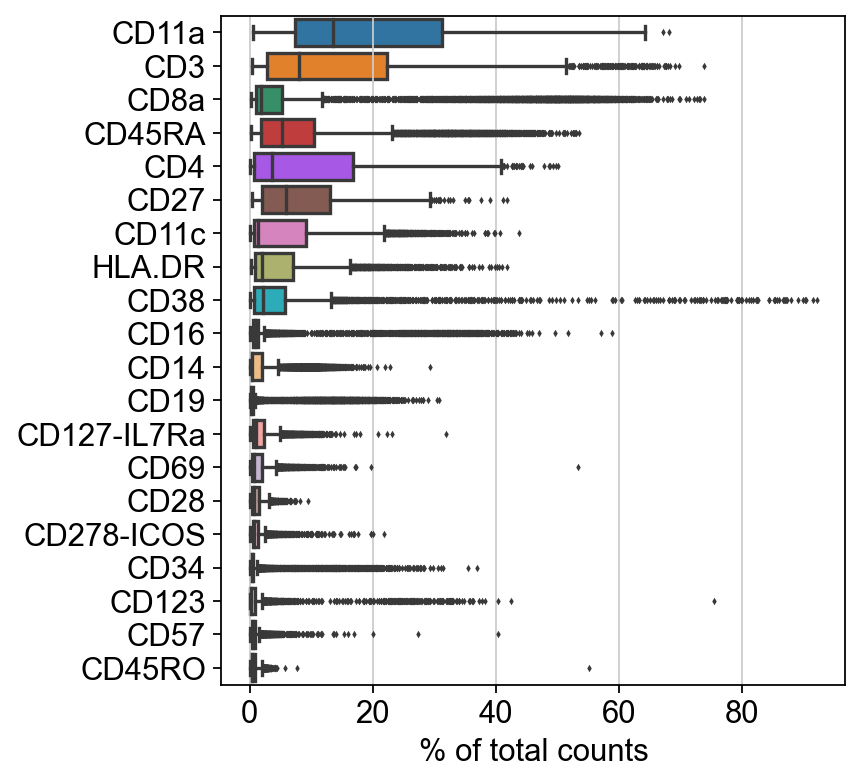

In [12]:
sc.settings.set_figure_params(dpi=80, facecolor='white')
sc.pl.highest_expr_genes(adt_adata, n_top=20)

In [13]:
sc.pp.normalize_total(adt_adata, target_sum=1e4)
sc.pp.log1p(adt_adata)

import scipy.stats.mstats
def clr(adata):
    temp = np.array(adata.X.todense() + 1)
    adata.X = np.log(temp / scipy.stats.mstats.gmean(temp, axis=1).reshape([-1, 1]))
    
# clr(adt_adata)

normalizing counts per cell
    finished ({time_passed})


In [14]:
sc.pp.scale(adt_adata, max_value=10)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [15]:
sc.tl.pca(adt_adata, svd_solver='arpack')

computing PCA
    with n_comps=24
    finished (0:00:00)


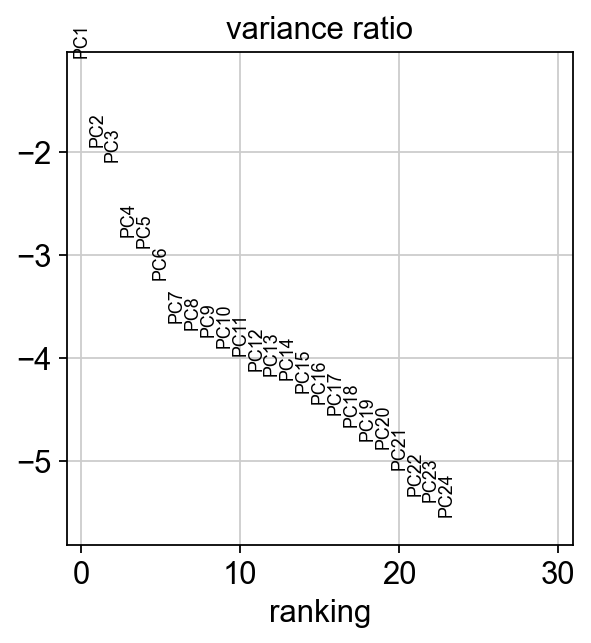

In [16]:
sc.pl.pca_variance_ratio(adt_adata, log=True)

In [17]:
sc.pp.neighbors(adt_adata, n_neighbors=50)
sc.tl.umap(adt_adata)

computing neighbors
    using data matrix X directly
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:12)


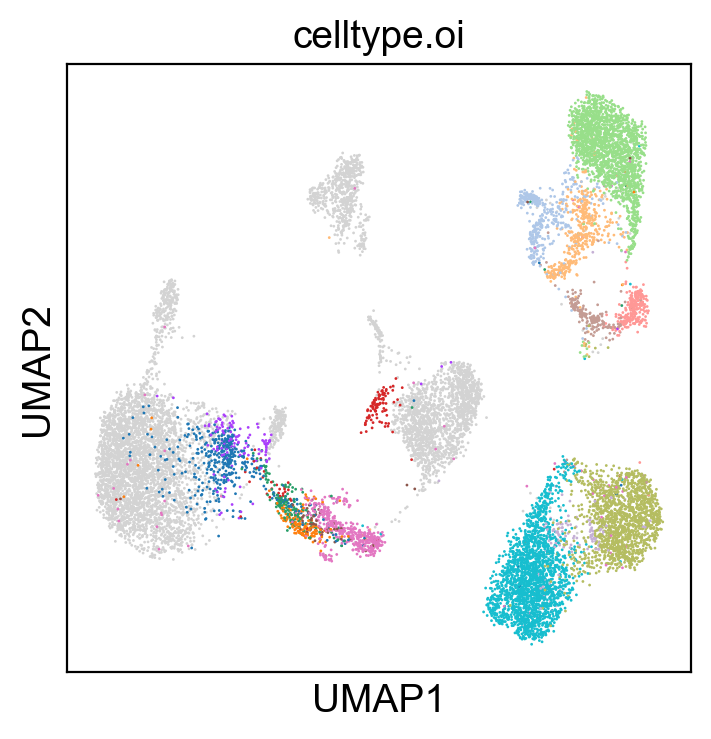

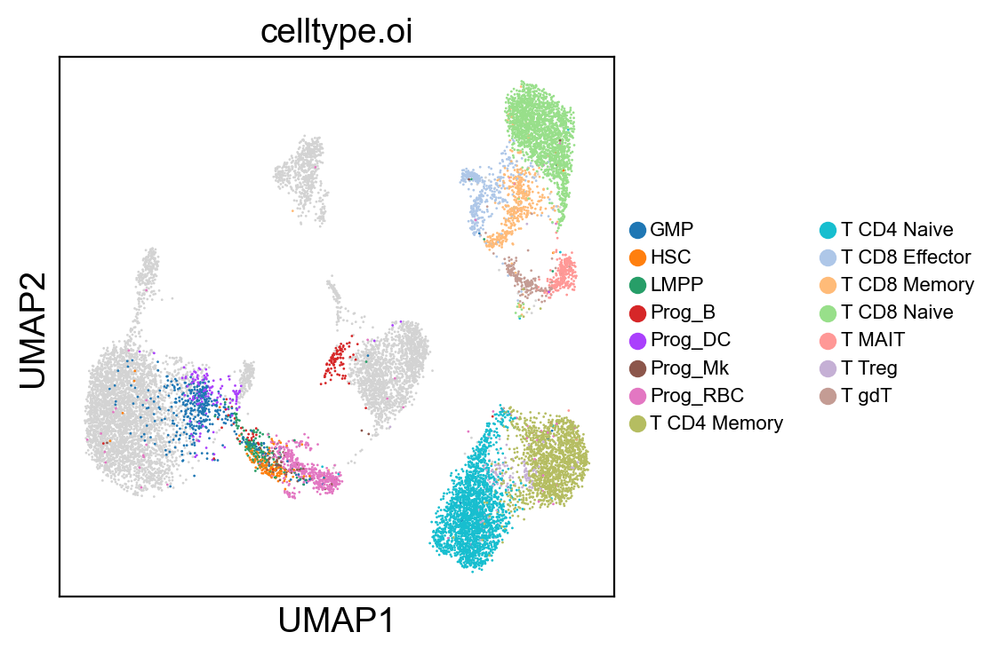

In [211]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adt_adata, color=['celltype.oi'], groups=celltype_oi, legend_loc=None, legend_fontsize=8., size=4.)
sc.pl.umap(adt_adata, color=['celltype.oi'], groups=celltype_oi, legend_fontsize=8., size=4.)

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])
... storing 'orig.ident' as categorical
... storing 'lane' as categorical
... storing 'donor' as categorical
... storing 'celltype.l1' as categorical
... storing 'celltype.l2' as categorical
... storing 'celltype.l1.5' as categorical
... storing 'B cell' as categorical
... storing 'Mono/DC' as categorical
... storing 'NK' as categorical
... storing 'Progenitor cells' as categorical
... storing 'T cell' as categorical


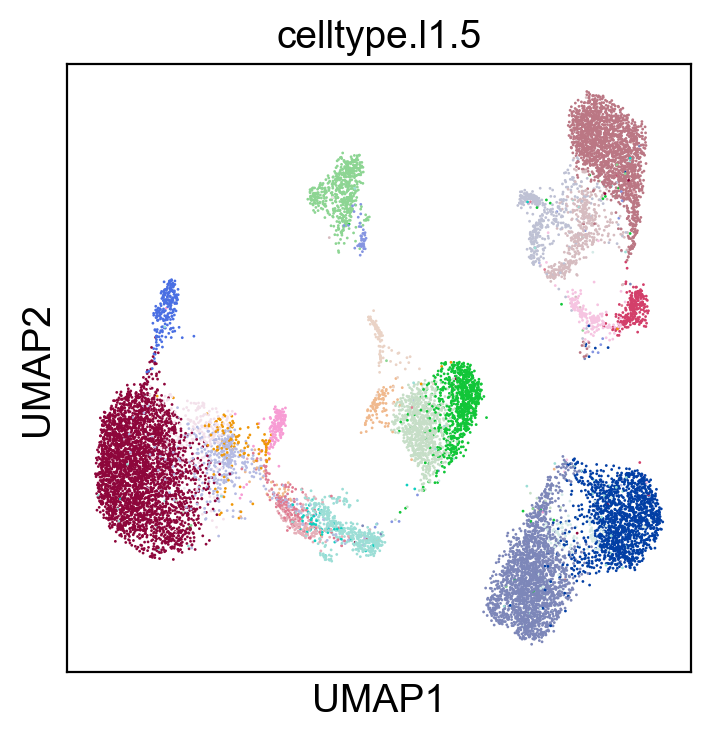

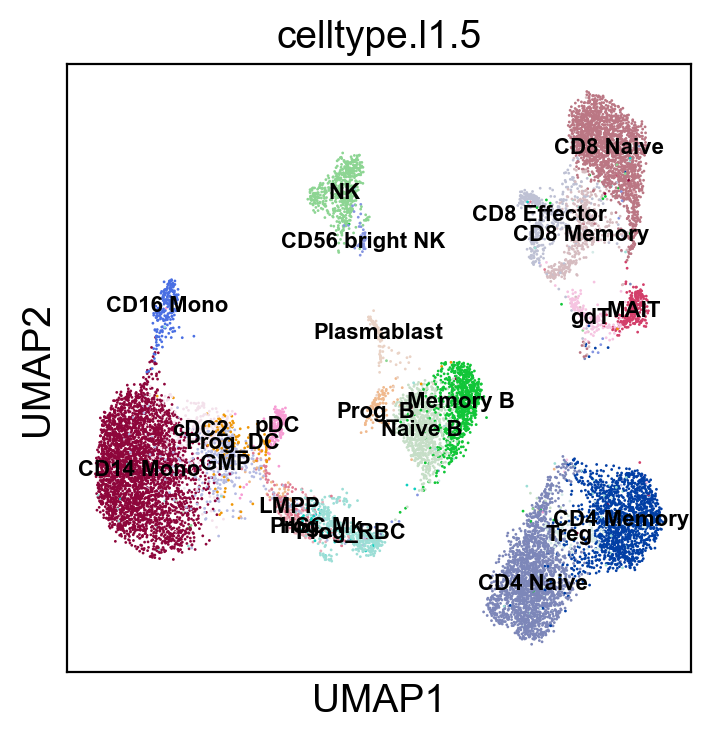

In [18]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(adt_adata, color=['celltype.l1.5'], legend_loc=None, legend_fontsize=8., size=4.)
sc.pl.umap(adt_adata, color=['celltype.l1.5'], legend_loc="on data", legend_fontsize=8., size=4.)

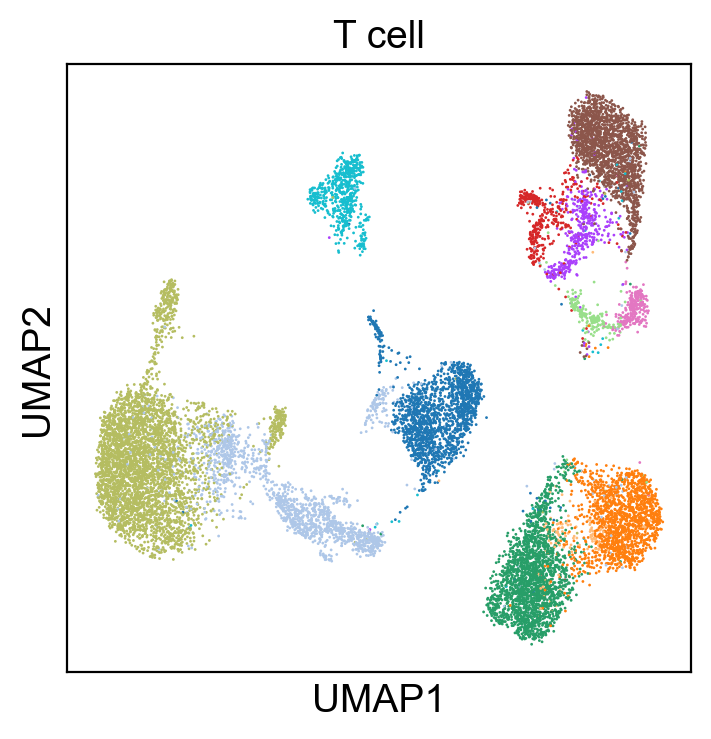

In [31]:
sc.pl.umap(adt_adata, color=['T cell'], legend_loc=None, legend_fontsize=8., size=4.)

## Process RNA

In [19]:
rna_adata = sc.AnnData(sc.read_mtx("../../CITE-seq/bmcn-rna.mtx").T)
rna_adata.obs = pd.read_csv("../../CITE-seq/bmnc-meta.csv")
rna_adata.var_names = pd.read_table("../../CITE-seq/bmcn-rna-features.txt", index_col=0, header=None).index.tolist()

In [20]:
rna_adata = rna_adata[rna_adata.obs.donor == 'batch1']

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):
C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:119: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [205]:
rna_adata.obs = adt_adata.obs.copy()

normalizing counts per cell
    finished (0:00:00)


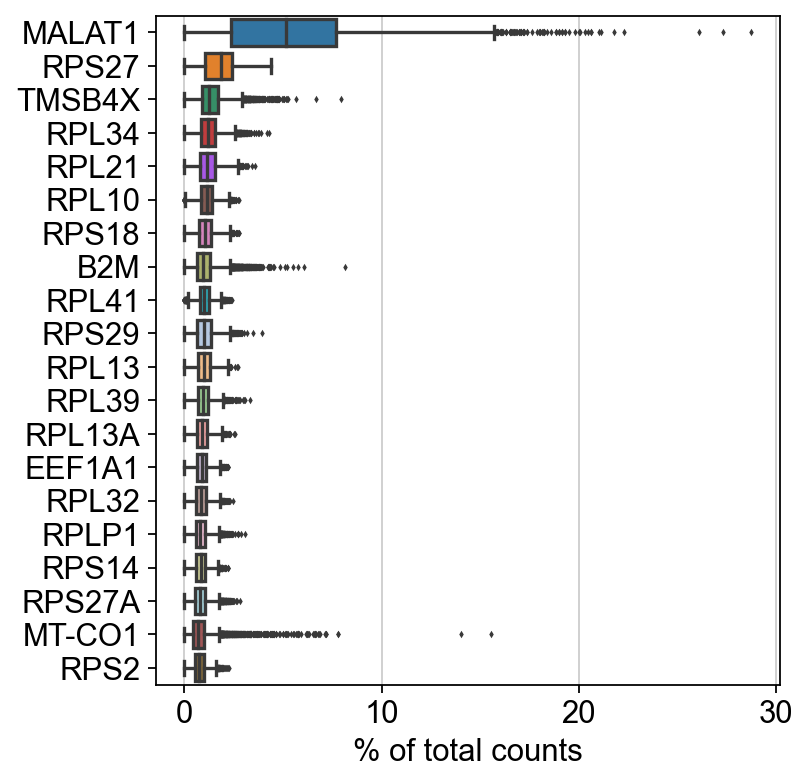

In [21]:
sc.settings.set_figure_params(dpi=80, facecolor='white')
sc.pl.highest_expr_genes(rna_adata, n_top=20)

In [22]:
sc.pp.normalize_total(rna_adata, target_sum=1e4)
sc.pp.log1p(rna_adata)

normalizing counts per cell
    finished (0:00:00)


In [23]:
#sc.pp.highly_variable_genes(rna_adata)
#sc.pl.highly_variable_genes(rna_adata)
#rna_adata.var.highly_variable.sum()

In [24]:
#rna_adata = rna_adata[:, rna_adata.var.highly_variable]

In [25]:
sc.pp.scale(rna_adata, max_value=10)
sc.tl.pca(rna_adata, svd_solver='arpack')

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:24)


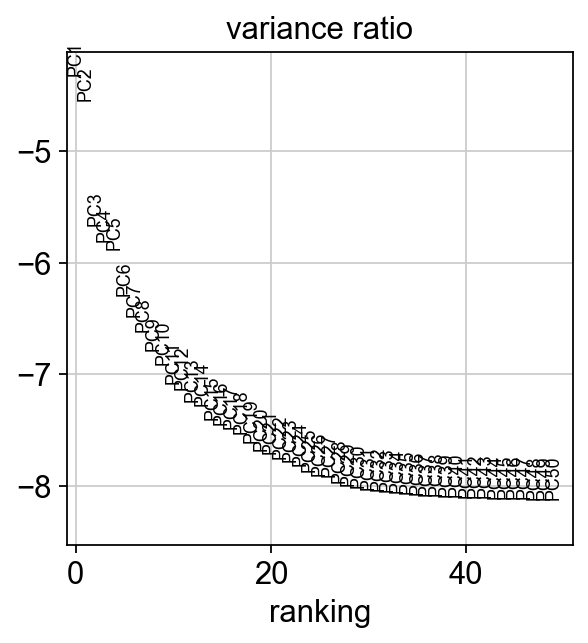

In [26]:
sc.pl.pca_variance_ratio(rna_adata, log=True, n_pcs=50)

In [78]:
sc.pp.neighbors(rna_adata, n_neighbors=40, n_pcs=50)
sc.tl.umap(rna_adata)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:06)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:11)


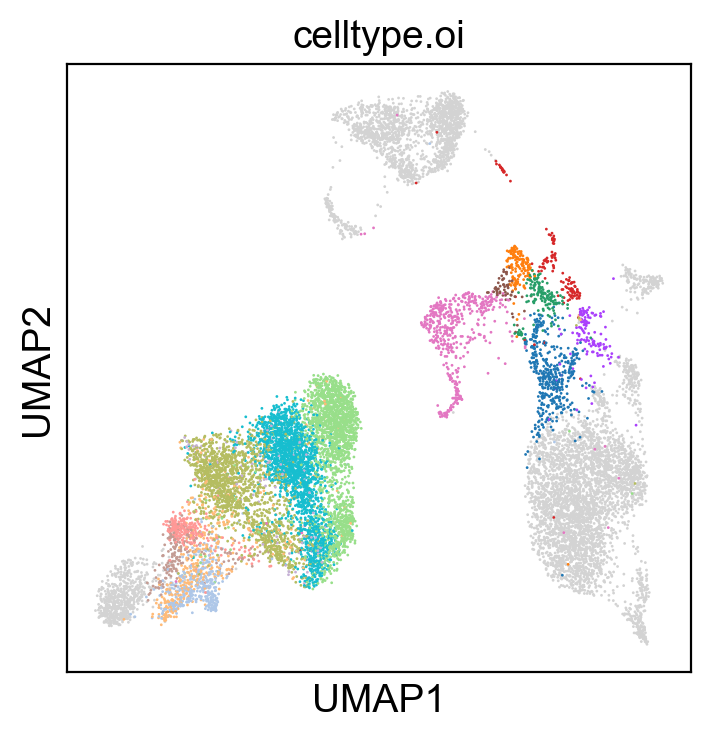

In [207]:
sc.pl.umap(rna_adata, color=['celltype.oi'], groups=celltype_oi, legend_loc=None, legend_fontsize=8., size=4.)

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


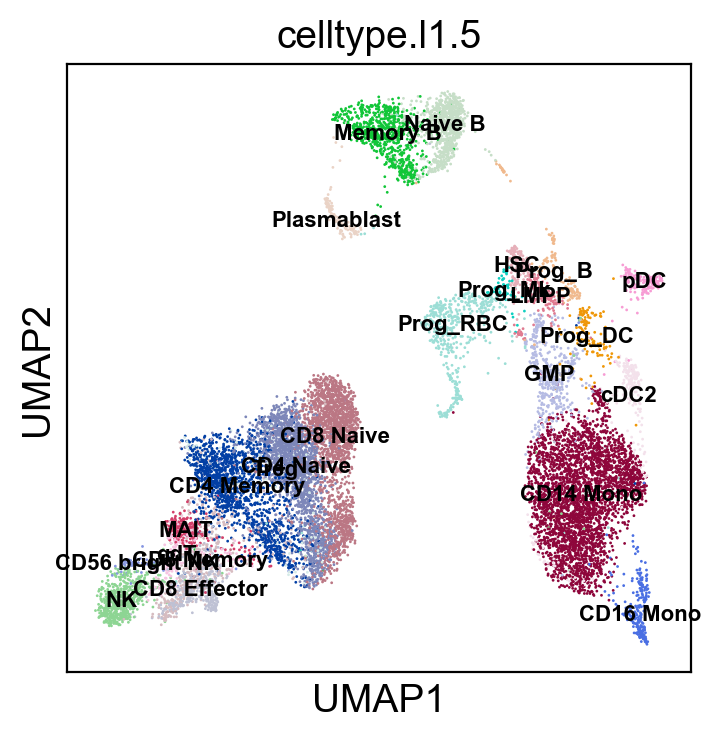

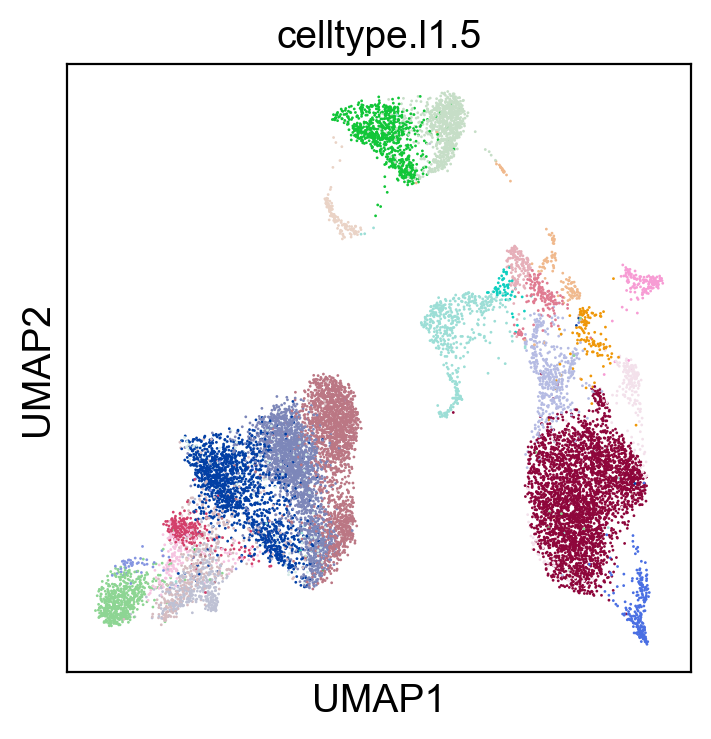

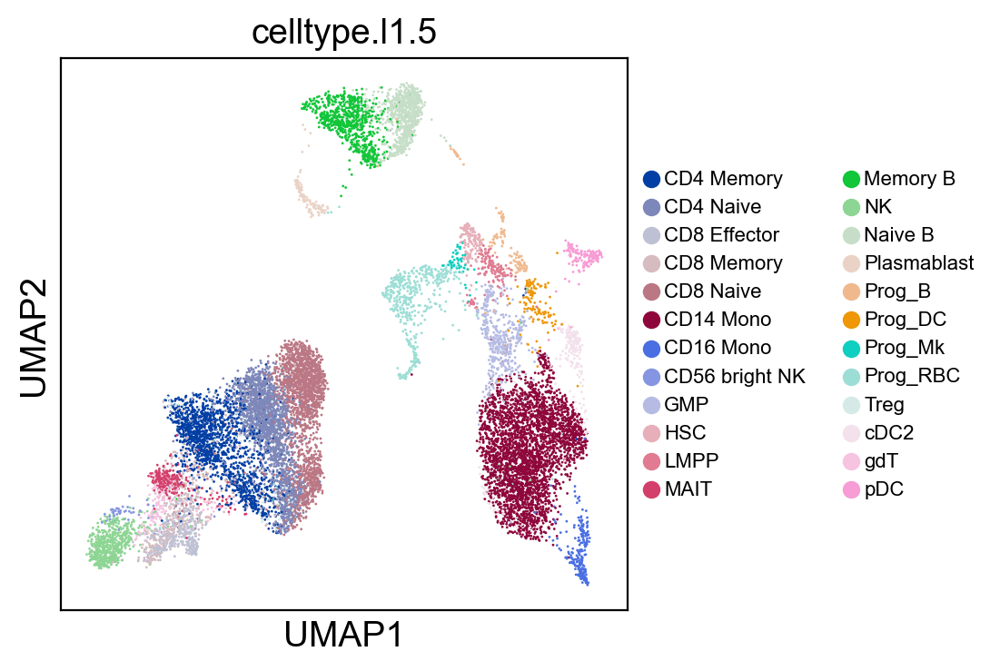

In [79]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.umap(rna_adata, color=['celltype.l1.5'], legend_loc="on data", legend_fontsize=8., size=4.)
sc.pl.umap(rna_adata, color=['celltype.l1.5'], legend_loc=None, legend_fontsize=8., size=4.)
sc.pl.umap(rna_adata, color=['celltype.l1.5'], legend_fontsize=8., size=4.)

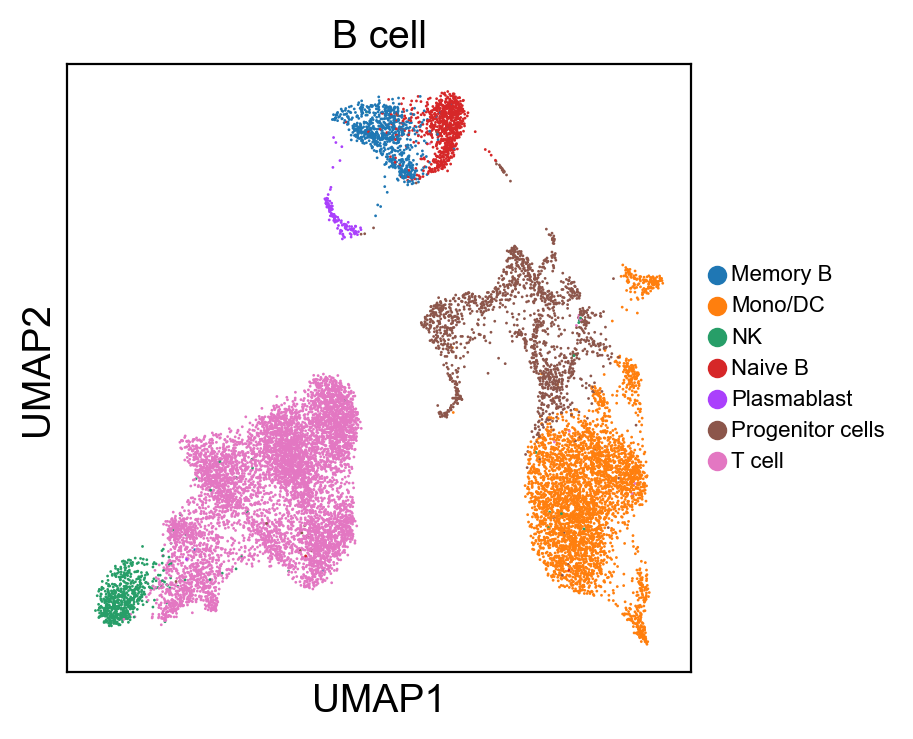

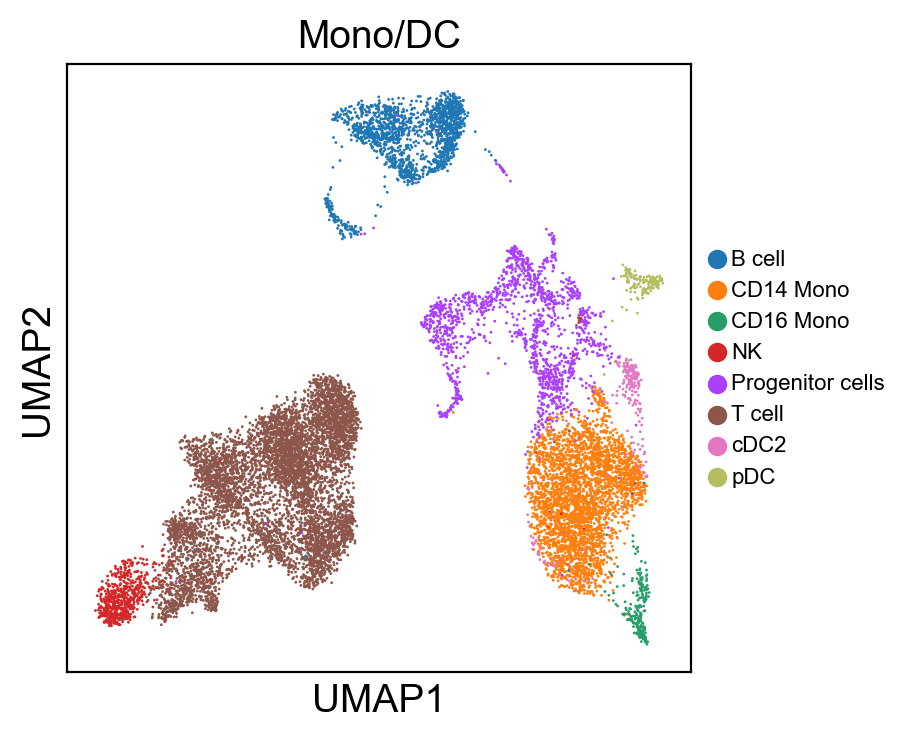

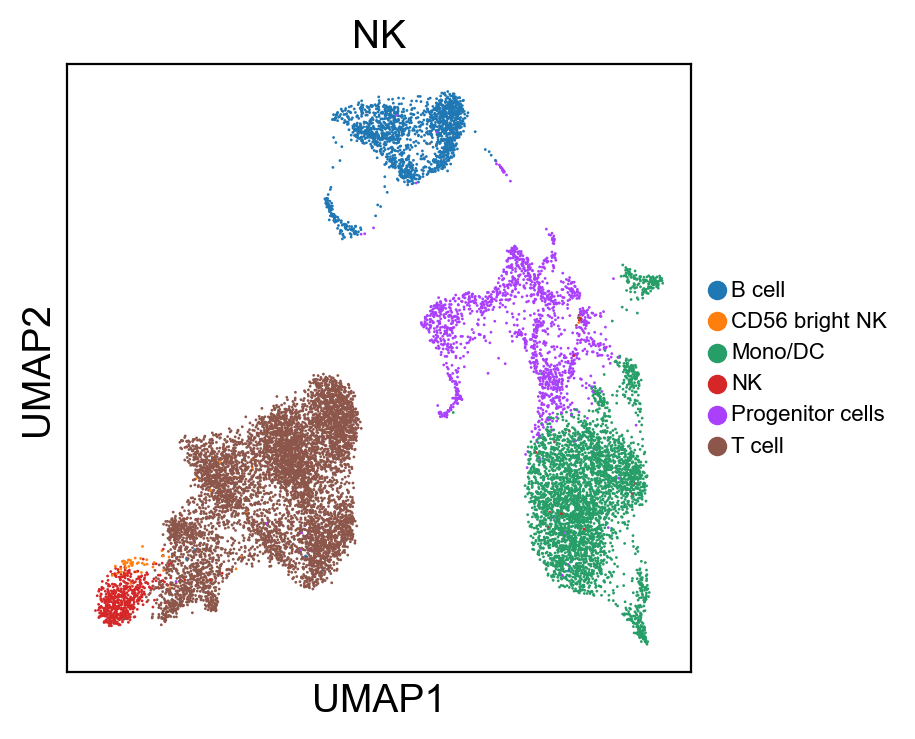

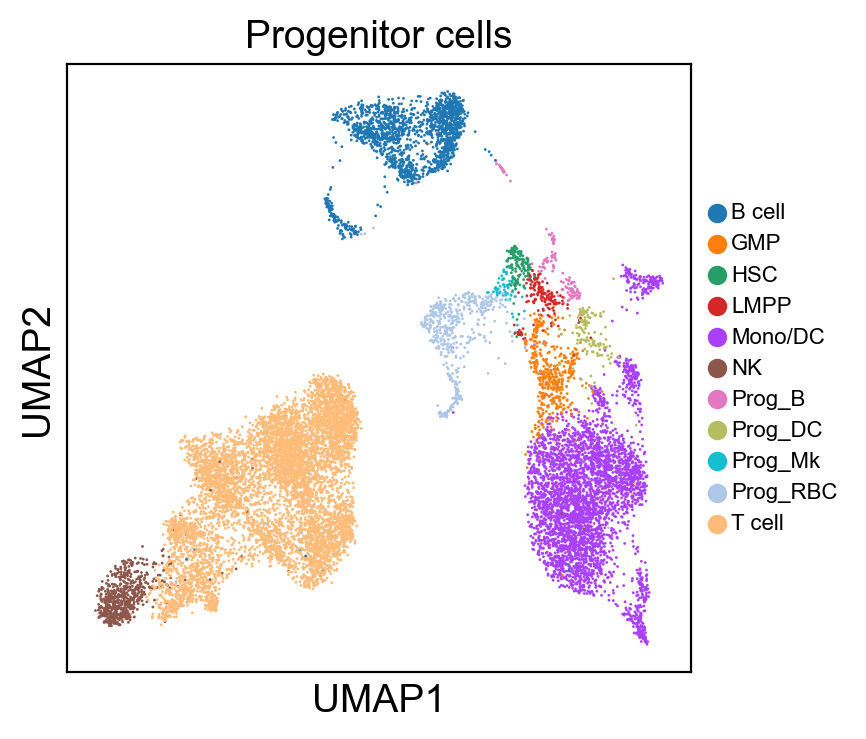

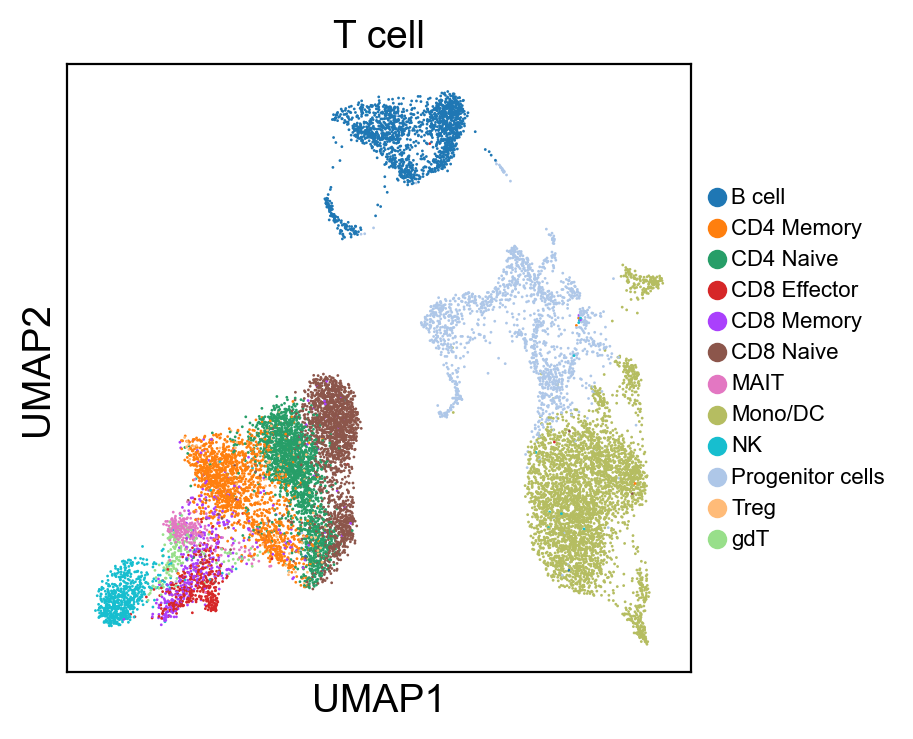

In [80]:
for g in groups:
    sc.pl.umap(rna_adata, color=[g], legend_fontsize=8., size=4.)

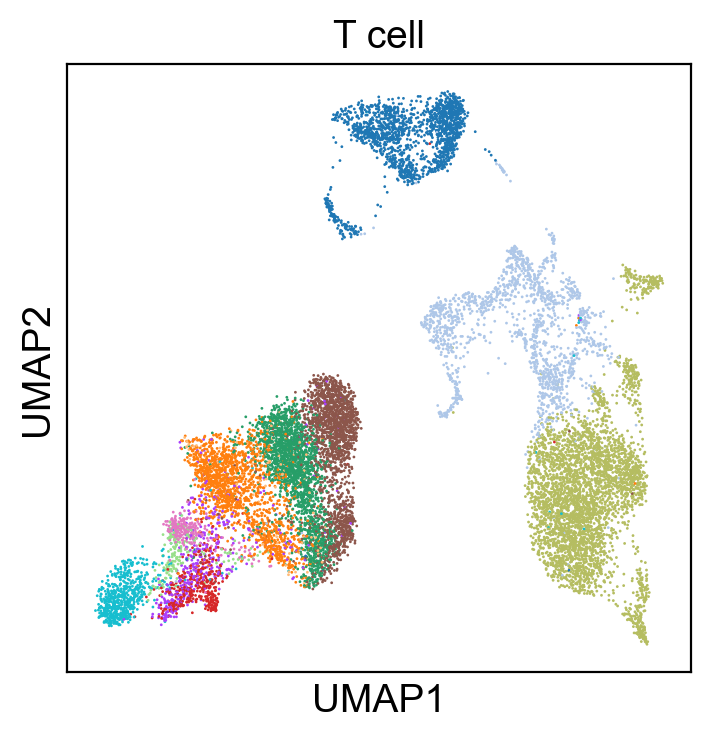

In [81]:
sc.pl.umap(rna_adata, color=['T cell'], legend_loc=None, legend_fontsize=8., size=4.)

## Compare Protein Profile with Gene Expression Profile

In [119]:
rna_adata.var_names[rna_adata.var_names.str.contains('ITGA')]

Index(['ITGA10', 'ITGA6', 'ITGA4', 'ITGAV', 'ITGA9', 'ITGA1', 'ITGA2', 'ITGA8',
       'ITGA5', 'ITGA7', 'ITGAL', 'ITGAM', 'ITGAX', 'ITGAE', 'ITGA2B',
       'ITGA3'],
      dtype='object')

In [127]:
coding_genes = {
    'CD11a': ['ITGAL'],
    'CD11c': ['ITGAX'],
    'CD123': ['IL3RA'],
    'CD127-IL7Ra': ['IL7R'],
    'CD14': ['CD14'],
    'CD16': ['FCGR3A', 'FCGR3B'],
    'CD161': ['KLRB1'],
    'CD19': ['CD19'],
    'CD197-CCR7': ['CCR7'],
    'CD25': ['IL2RA'],
    'CD27': ['CD27'],
    'CD278-ICOS': ['ICOS'],
    'CD28': ['CD28'],
    'CD3': ['CD3D', 'CD3E', 'CD3G'],
    'CD34': ['CD34'],
    'CD38': ['CD38'],
    'CD4': ['CD4'],
    'CD45RA': ['PTPRC'],
    'CD45RO': ['PTPRC'],
    'CD56': ['NCAM1'],
    'CD57': ['B3GAT1'],
    'CD69': ['CD69'],
    'CD79b': ['CD79B'],
    'CD8a': ['CD8A'],
    'HLA.DR': ['HLA-DRA', 'HLA-DRB1']
}

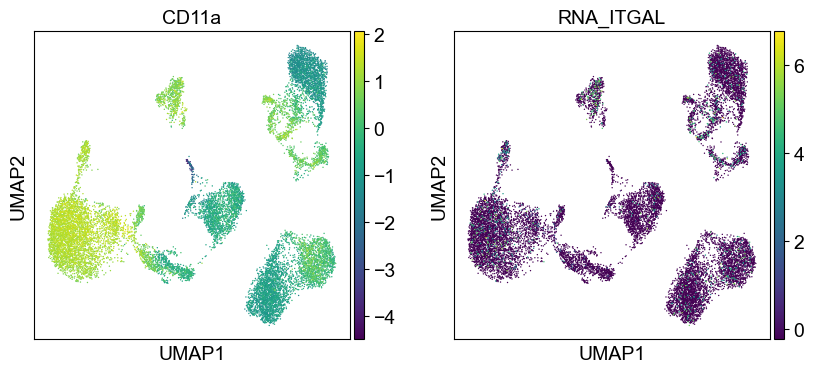

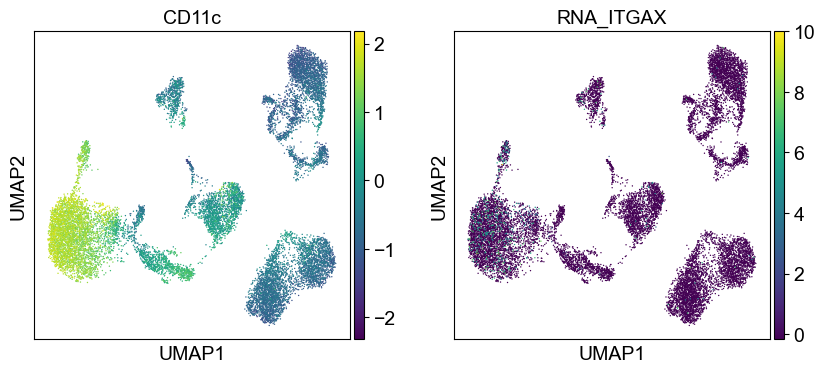

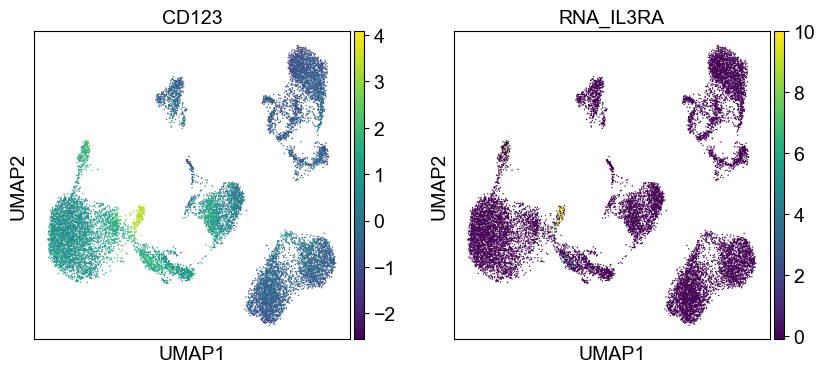

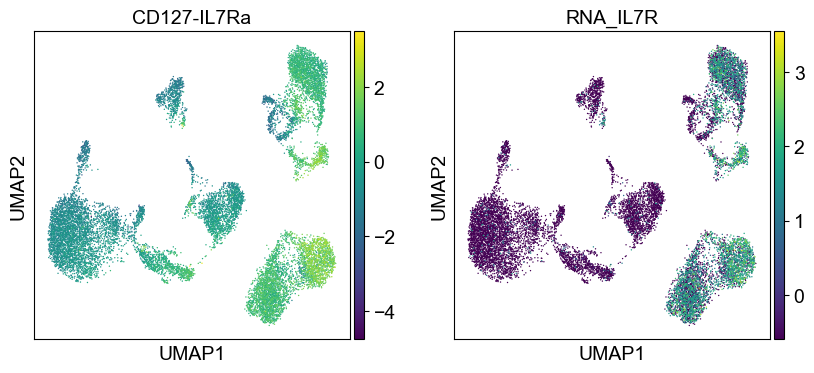

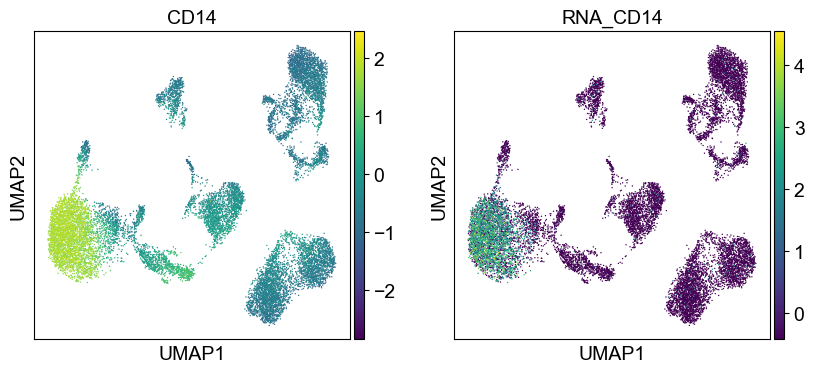

...

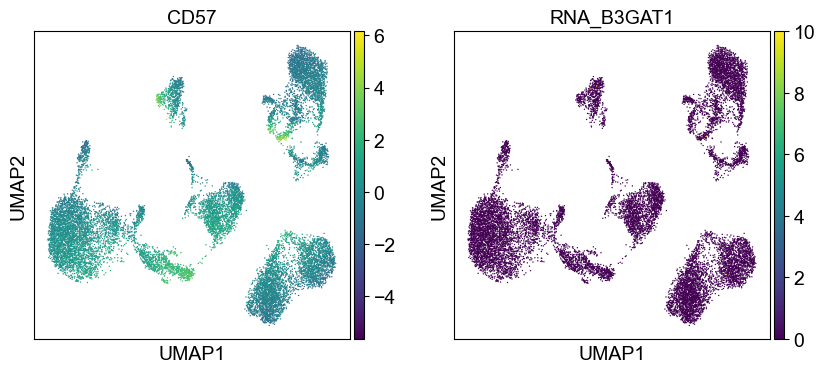

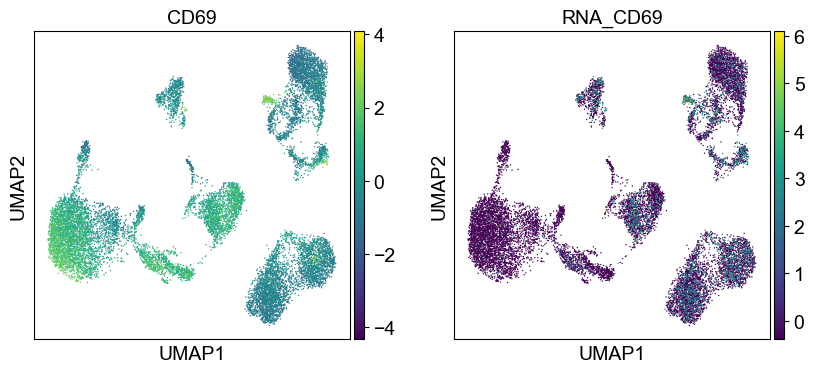

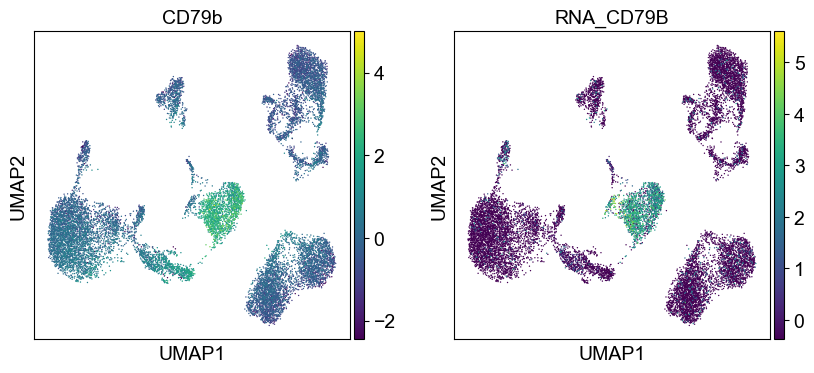

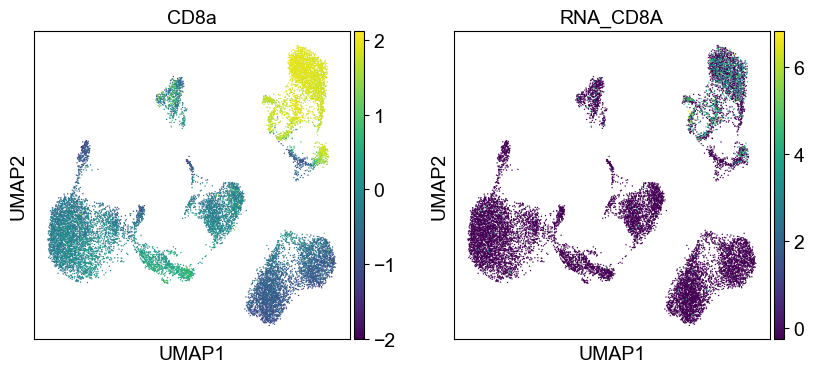

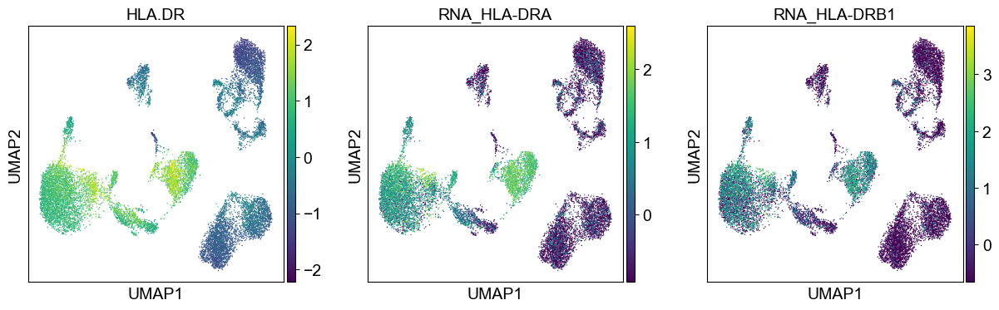

In [128]:
sc.settings.set_figure_params(dpi=50, facecolor='white')
temp_adata = adt_adata.copy()
for i in coding_genes:
    for j in coding_genes[i]:
        temp_adata.obs['RNA_' + j] = rna_adata[:, j].X.squeeze().tolist()
    sc.pl.umap(temp_adata, color=[i] + ['RNA_' + j for j in coding_genes[i]], legend_fontsize=8., size=4.)

### Use genes encoding these proteins for embedding

In [131]:
coding_adata = rna_adata.copy()[:, sum(coding_genes.values(), [])]
coding_adata

View of AnnData object with n_obs × n_vars = 14468 × 29
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'lane', 'donor', 'celltype.l1', 'celltype.l2', 'RNA.weight', 'celltype.l1.5', 'B cell', 'Mono/DC', 'NK', 'Progenitor cells', 'T cell'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'celltype.l1_colors', 'celltype.l2_colors', 'celltype.t_colors', 'celltype.l1.5_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [132]:
sc.tl.pca(coding_adata, svd_solver='arpack')

computing PCA
    with n_comps=28


Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


    finished (0:00:00)


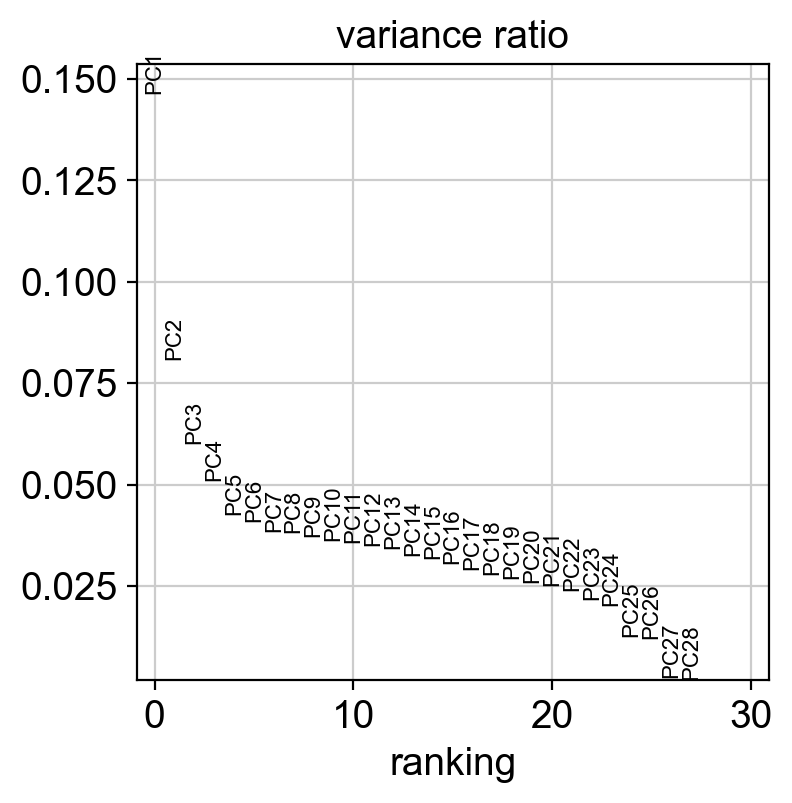

In [136]:
sc.settings.set_figure_params(dpi=100, facecolor='white')
sc.pl.pca_variance_ratio(coding_adata)

In [143]:
sc.pp.neighbors(coding_adata, n_pcs=5, use_rep="X_pca")
sc.tl.umap(coding_adata)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:07)


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


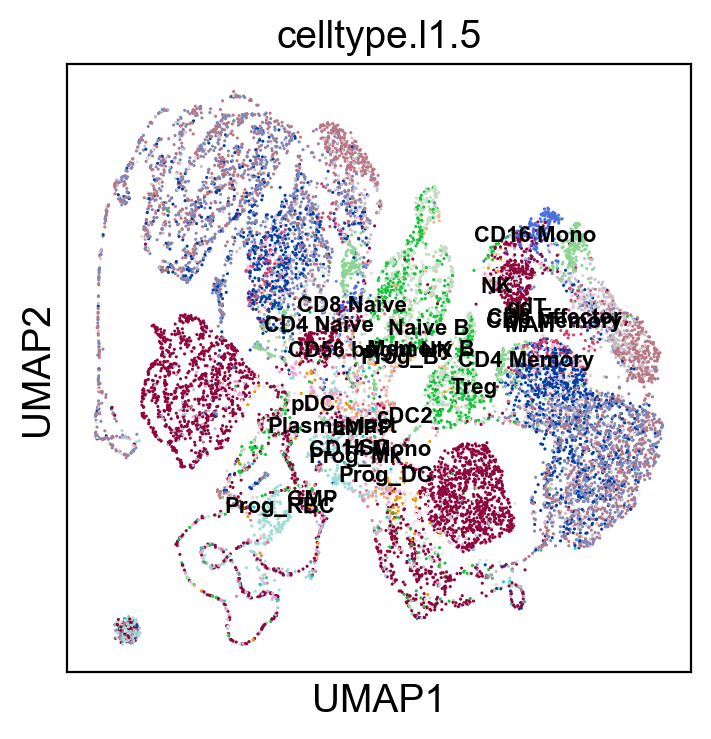

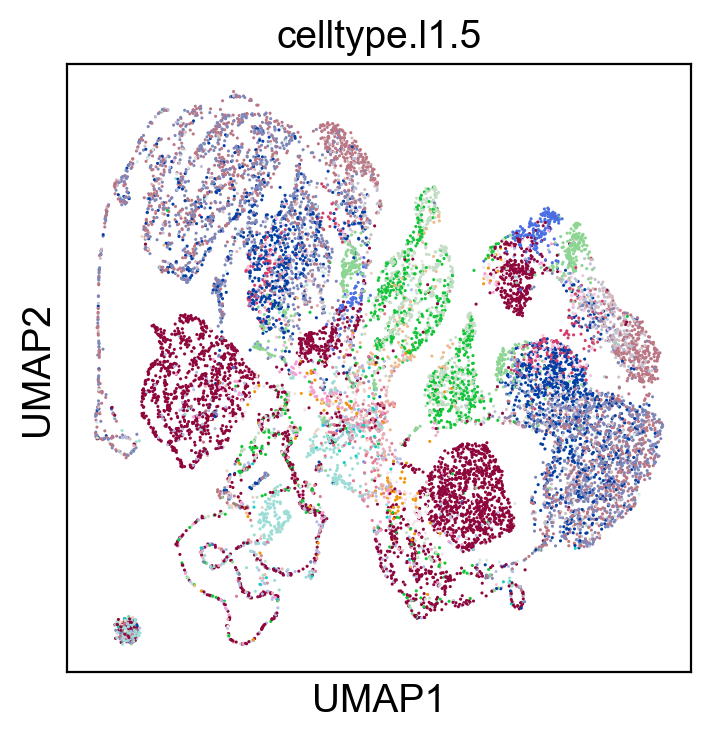

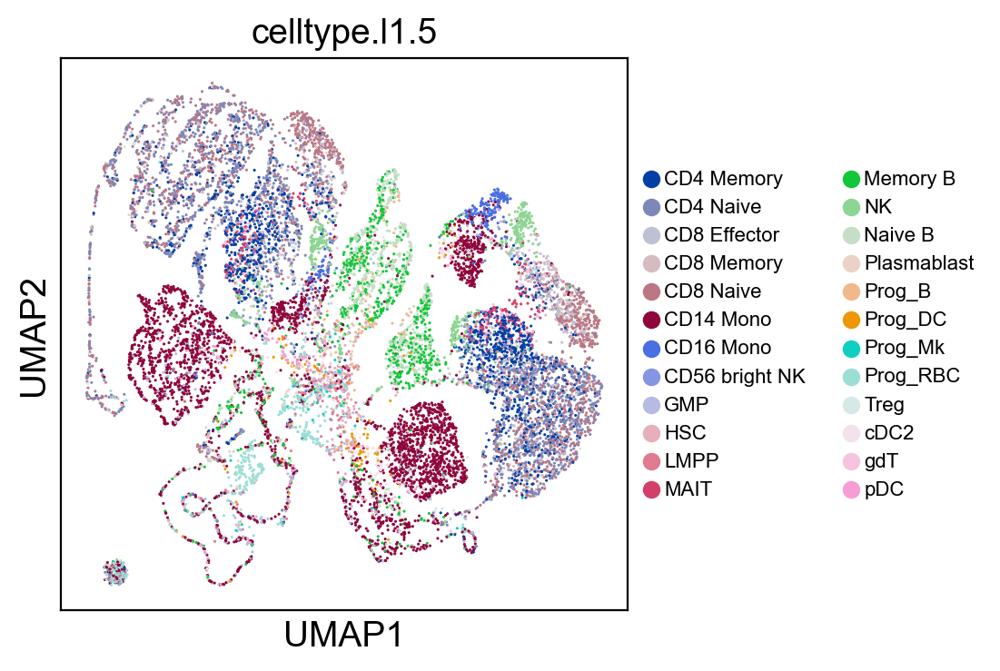

In [144]:
sc.pl.umap(coding_adata, color=['celltype.l1.5'], legend_loc="on data", legend_fontsize=8., size=5.)
sc.pl.umap(coding_adata, color=['celltype.l1.5'], legend_loc=None, legend_fontsize=8., size=5.)
sc.pl.umap(coding_adata, color=['celltype.l1.5'], legend_fontsize=8., size=5.)

## SCMER Feature Selection

In [32]:
import sys
sys.path.insert(0,'..')
import scmer

model = scmer.UmapL1(lasso=1e-4, ridge=0., n_pcs=None, perplexity=100., use_beta_in_Q=True, n_threads=6, 
                             max_outer_iter=2)
model.fit(rna_adata.X, X_teacher=adt_adata.X)

Calculating distance matrix and scaling factors...
Computing pairwise distances...
Using 6 threads...
Mean value of sigma: 0.418976
Done. Elapsed time: 195.29 seconds. Total: 195.29 seconds.
Creating model without batches...
Optimizing using OWLQN (because lasso is nonzero)...
0 loss (before this step): 6.656130313873291 Nonzero (after): 140 Elapsed time: 1650.20 seconds. Total: 1845.50 seconds.
1 loss (before this step): 4.145781517028809 Nonzero (after): 140 Elapsed time: 1612.17 seconds. Total: 3457.67 seconds.
Final loss: 4.119104385375977 Nonzero: 140 Elapsed time: 22.90 seconds. Total: 3480.57 seconds.


In [34]:
print(*rna_adata.var_names[model.get_mask()])

MXRA8 RCAN3 SH3BGRL3 CD52 CSF3R CD2 CTSS S100A11 S100A9 S100A12 S100A8 S100A6 S100A4 RPS27 MNDA FCER1G FCGR3A TMSB10 GNLY CD8A CD8B MAL DUSP2 RPL32 CMC1 GPX1 TKT FHIT CSTA SPINK2 JCHAIN IL7R FYB GZMA RPS23 VCAN MEF2C MZB1 CD14 CD74 RPS14 LTB LST1 AIF1 HLA-DRA HLA-DRB5 HLA-DRB1 HLA-DQB1 HLA-DPA1 HLA-DPB1 RPS18 RPS12 TRGC2 FGL2 LRRN3 TRBC1 TRBC2 GIMAP7 TMSB4X AP1S2 PRDX4 SAT1 CYBB CFP RPS4X SARAF CEBPD FCN1 RPLP2 CARS SPI1 MPEG1 MS4A6A FTH1 NEAT1 MALAT1 CTSW GSTP1 RPS3 CD3D CD3G RPS25 APLP2 VIM SRGN PSAP RPS24 CD27 GAPDH KLRB1 KLRF1 CLEC7A KLRD1 RP11-291B21.2 LDHB RP11-620J15.3 LYZ BTG1 RPL21 GPR183 TNFSF13B TRDC TRAC GZMB RPS29 NPC2 FOS SERPINA1 IGHM B2M RPLP1 VIMP IL32 PYCARD COTL1 CYBA CD68 TNFRSF13B CCL5 CCL4 GRN CD79B CD7 CST3 CST7 LINC01272 CFD RETN HCST TYROBP FTL NOSIP NKG7 LGALS2 LGALS1 RPL3 TSPO TYMP MT-CO1 MT-CO3


In [147]:
pd.DataFrame({'weight': model.w[model.w > 0]}, rna_adata.var_names[model.get_mask()]).to_csv("bmnc-140.csv")

<AxesSubplot:>

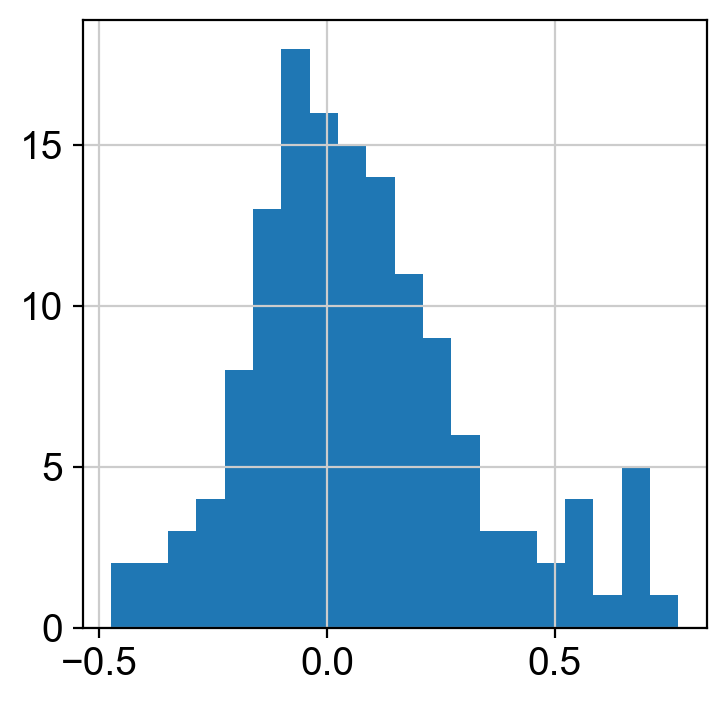

In [59]:
w_df = pd.read_csv("bmnc-140.csv", index_col=0)
w_df.weight.apply(np.log10).hist(bins=20)

## Validation

In [69]:
new_adata = rna_adata.copy()[:, w_df.index.tolist()]

sc.tl.pca(new_adata, svd_solver='arpack')
new_adata

computing PCA
    with n_comps=50
    finished (0:00:00)


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1094: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if not is_categorical(df_full[k]):


AnnData object with n_obs × n_vars = 14468 × 140
    obs: 'Unnamed: 0', 'orig.ident', 'nCount_RNA', 'nFeature_RNA', 'nCount_ADT', 'nFeature_ADT', 'lane', 'donor', 'celltype.l1', 'celltype.l2', 'RNA.weight', 'celltype.l1.5', 'B cell', 'Mono/DC', 'NK', 'Progenitor cells', 'T cell'
    var: 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'celltype.l1.5_colors', 'T cell_colors', 'B cell_colors', 'Mono/DC_colors', 'NK_colors', 'Progenitor cells_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

In [208]:
new_adata.obs = rna_adata.obs.copy()

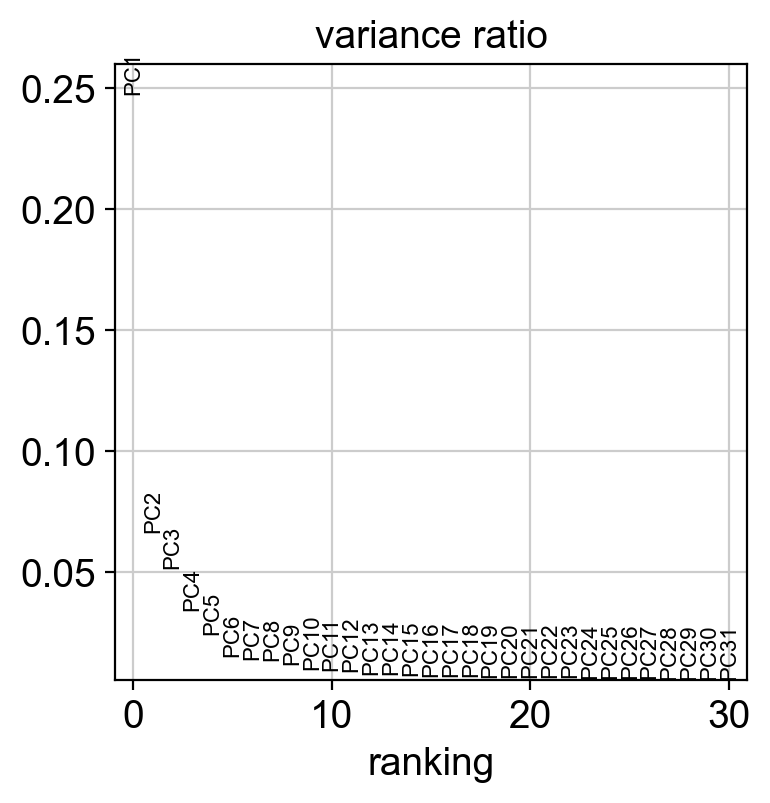

In [70]:
sc.pl.pca_variance_ratio(new_adata)

In [214]:
sc.pp.neighbors(new_adata, n_pcs=14, use_rep="X_pca")
sc.tl.umap(new_adata, random_state=2)

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:01)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:08)


C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


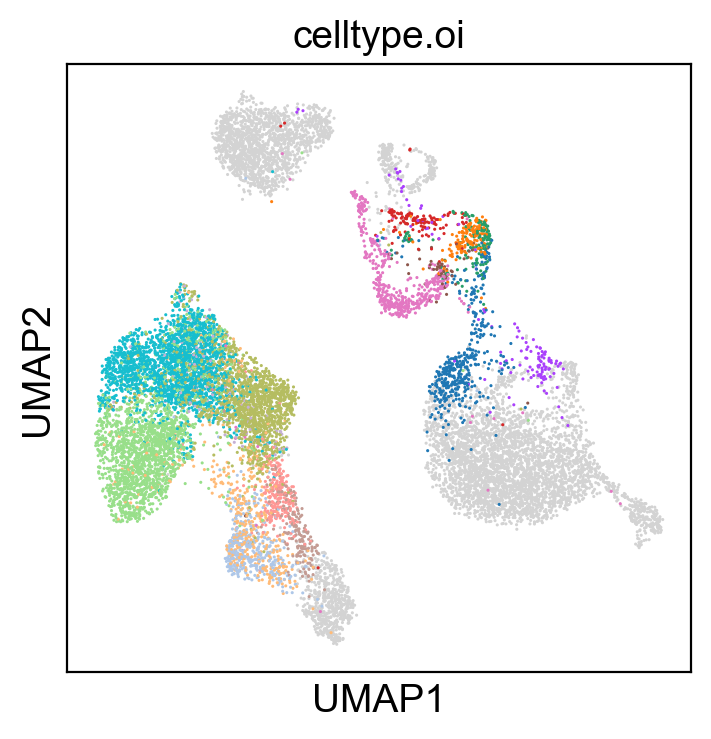

In [215]:
sc.pl.umap(new_adata, color=['celltype.oi'], groups=celltype_oi, legend_loc=None, legend_fontsize=8., size=5.)

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


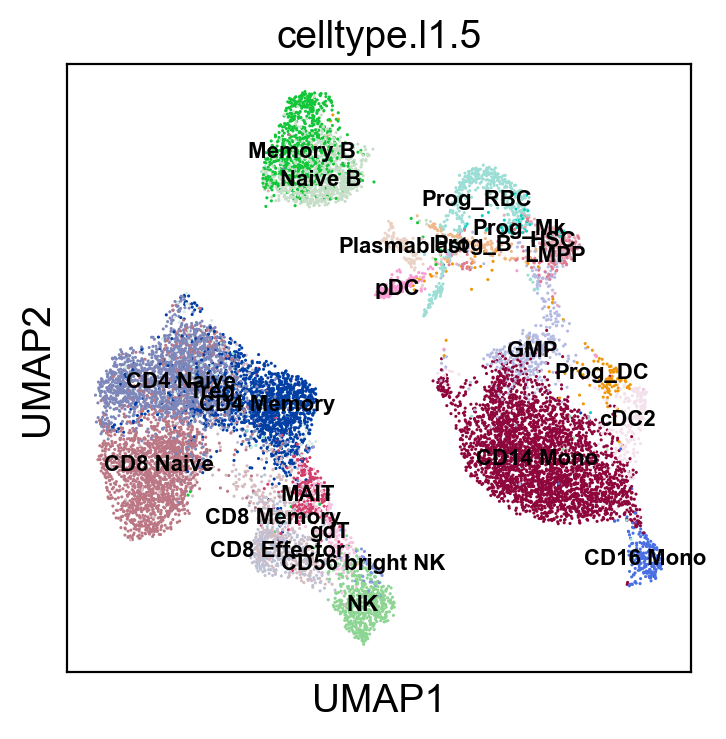

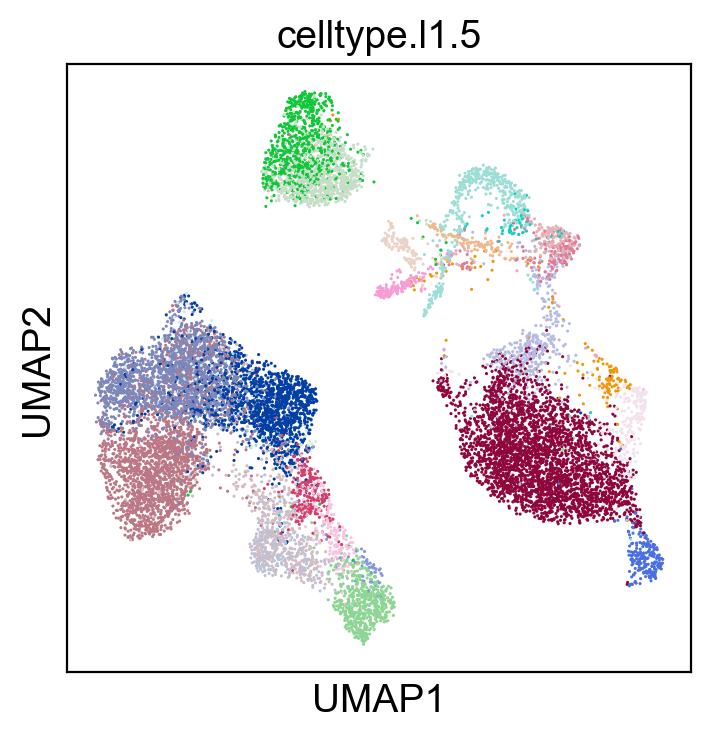

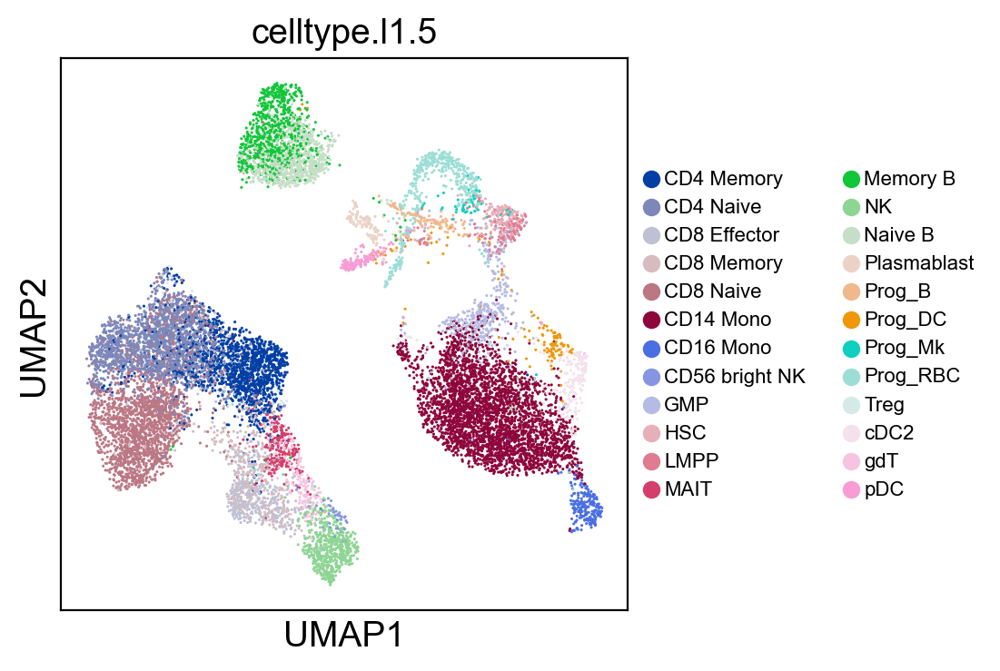

In [75]:
sc.pl.umap(new_adata, color=['celltype.l1.5'], legend_loc="on data", legend_fontsize=8., size=5.)
sc.pl.umap(new_adata, color=['celltype.l1.5'], legend_loc=None, legend_fontsize=8., size=5.)
sc.pl.umap(new_adata, color=['celltype.l1.5'], legend_fontsize=8., size=5.)

C:\Users\SLiang3\Miniconda3\envs\scanpy37\lib\site-packages\anndata\_core\anndata.py:1192: FutureWarning: is_categorical is deprecated and will be removed in a future version.  Use is_categorical_dtype instead
  if is_string_dtype(df[key]) and not is_categorical(df[key])


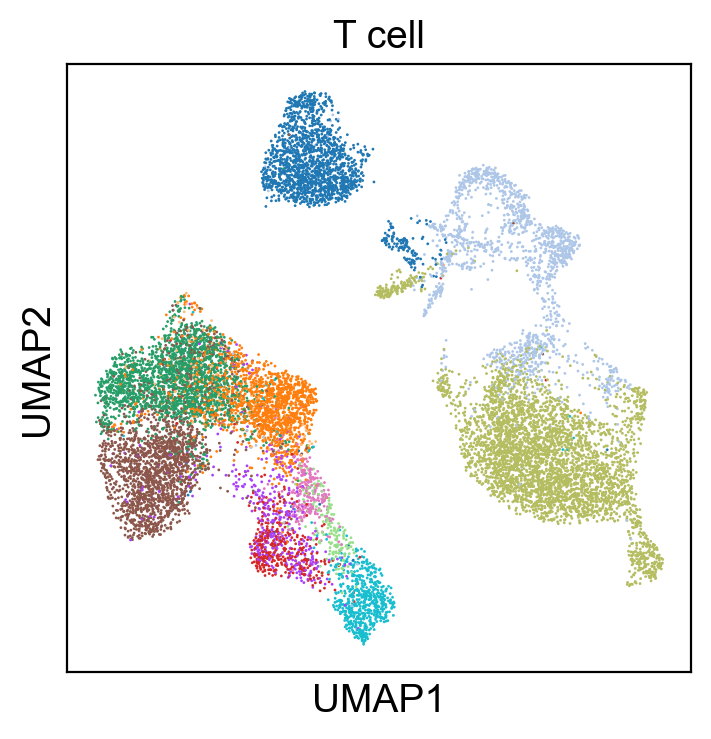

In [77]:
sc.pl.umap(new_adata, color=['T cell'], legend_loc=None, legend_fontsize=8., size=4.)

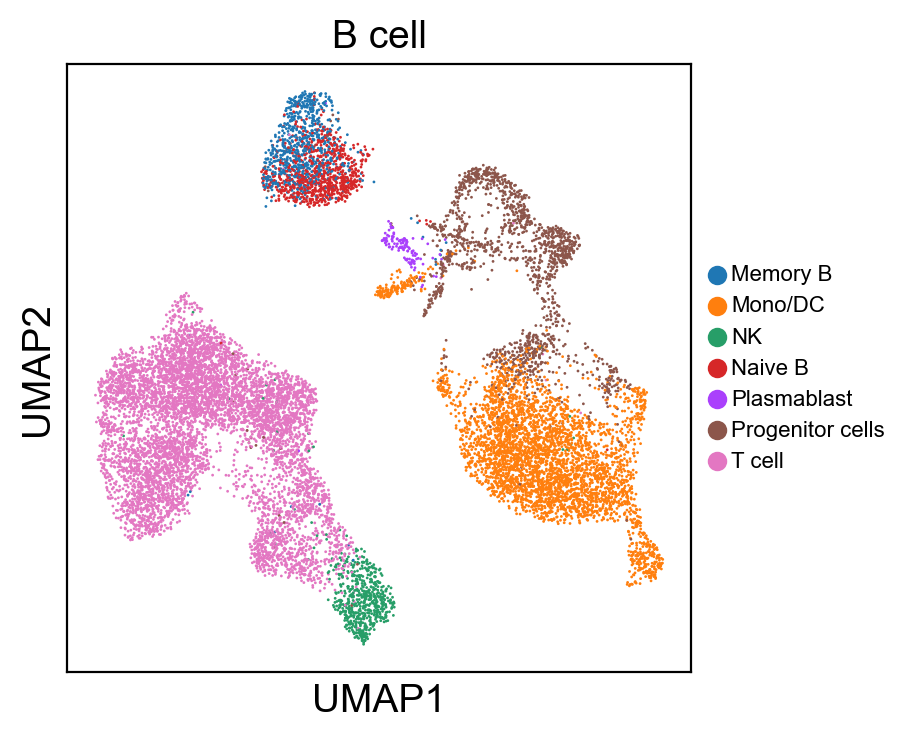

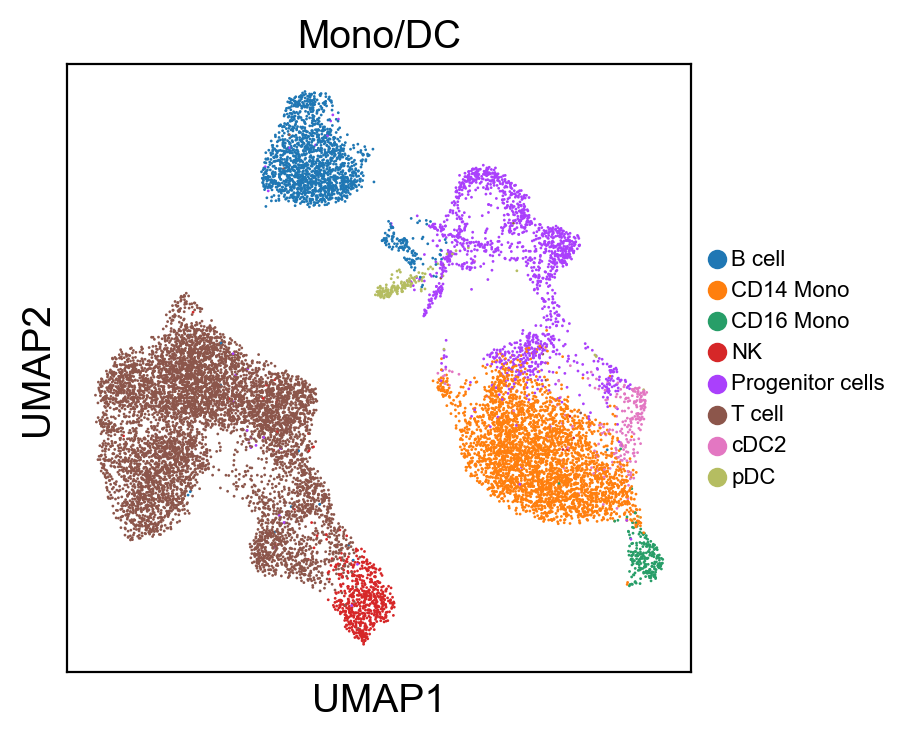

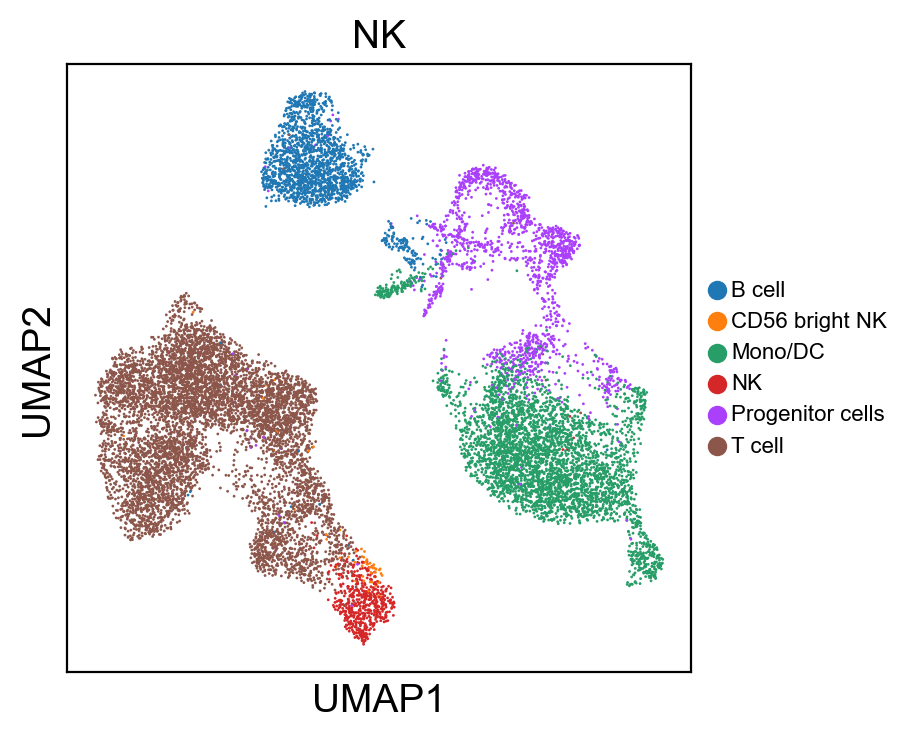

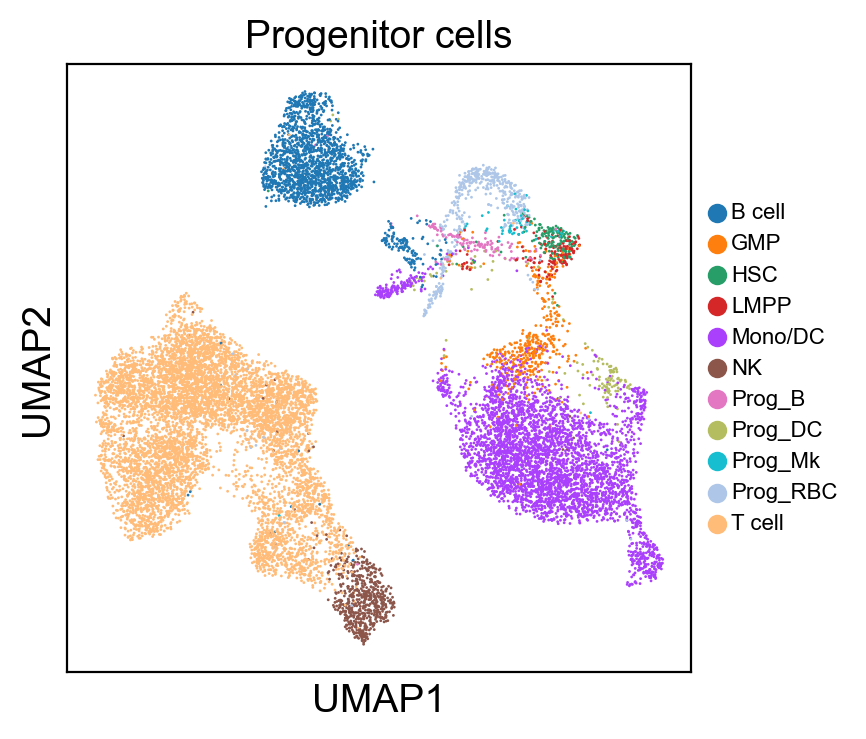

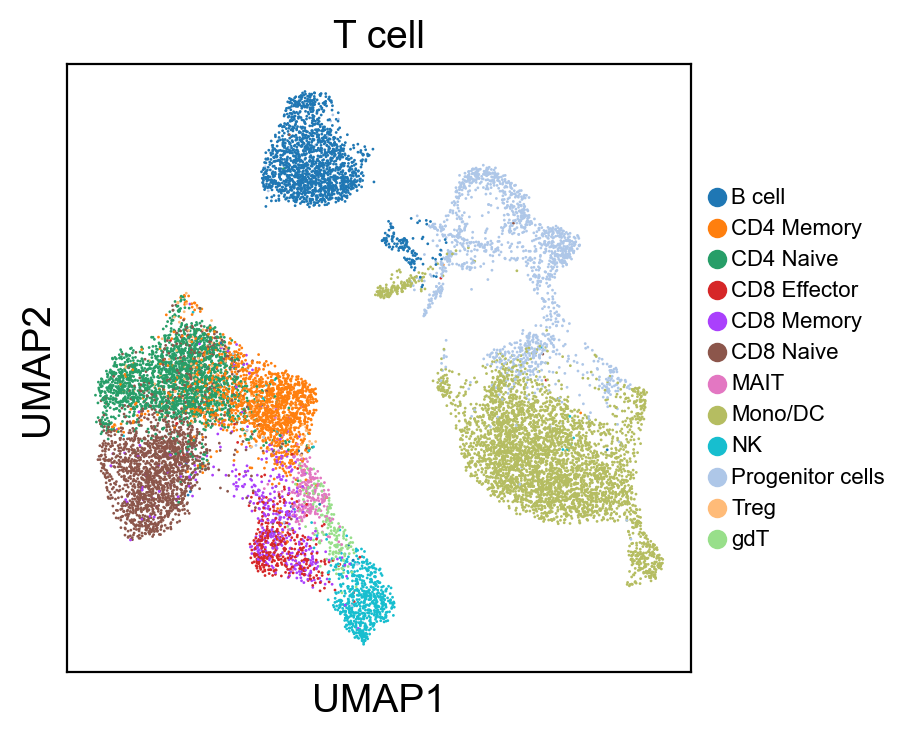

In [76]:
for g in groups:
    sc.pl.umap(new_adata, color=[g], legend_fontsize=8., size=4.)

In [220]:
import pandas as pd
import seaborn as sn
import matplotlib.pyplot as plt

rna_df = pd.DataFrame(new_adata.X, columns=['RNA_' + i for i in new_adata.var.index])
adt_df = pd.DataFrame(adt_adata.X, columns=adt_adata.var.index)
df = pd.concat([rna_df.reset_index(drop=True), 
                adt_df.reset_index(drop=True)], 
               axis=1)

corrMatrix = df.corr()
corrMatrix = corrMatrix.loc[corrMatrix.index.str.contains('RNA_'), ~corrMatrix.columns.str.contains('RNA_')]

In [221]:
corrMatrix

,CD11a,CD11c,CD123,CD127-IL7Ra,CD14,CD16,CD161,CD19,CD197-CCR7,CD25,...,CD38,CD4,CD45RA,CD45RO,CD56,CD57,CD69,CD79b,CD8a,HLA.DR
RNA_MXRA8,-0.096696,-0.075410,-0.075424,0.054862,-0.064237,-0.057229,-0.067292,-0.046505,-0.032073,-0.055392,...,-0.075050,-0.072315,0.037095,-0.088829,-0.043786,-0.071894,-0.083478,-0.054547,0.112368,-0.096752
RNA_RCAN3,-0.216415,-0.213920,-0.187302,0.211733,-0.188286,-0.157160,-0.136708,-0.131888,-0.077241,-0.056711,...,-0.176999,0.076995,-0.009945,-0.101202,-0.122974,-0.150426,-0.210862,-0.123529,0.048675,-0.258249
RNA_SH3BGRL3,0.473814,0.383632,0.188136,-0.260983,0.362906,0.060738,0.050500,-0.108917,-0.131040,-0.019300,...,0.104369,-0.013909,-0.258278,0.236813,0.052699,0.003175,0.194546,-0.053802,-0.083814,0.242309
RNA_CD52,-0.360278,-0.371057,-0.318620,0.296195,-0.367215,-0.197944,-0.066286,0.126527,-0.054353,0.024909,...,-0.473881,0.014853,0.096060,-0.051775,-0.200610,-0.172137,-0.265773,0.049702,0.008591,-0.259865
RNA_CSF3R,0.422989,0.487263,0.267991,-0.267919,0.510559,0.001535,0.005920,-0.044047,0.020873,0.008455,...,0.312650,0.069337,-0.209533,0.200990,0.059690,0.072923,0.329297,0.018469,-0.099923,0.300643
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
RNA_RPL3,-0.524350,-0.613688,-0.373746,0.438167,-0.580601,-0.191391,-0.054927,-0.034711,-0.057972,-0.030489,...,-0.425477,0.001718,0.190272,-0.250650,-0.149052,-0.176556,-0.401634,-0.069265,0.141893,-0.426017
RNA_TSPO,0.497896,0.560065,0.319008,-0.276632,0.560092,0.052403,0.032805,-0.072615,0.036809,0.035471,...,0.348303,0.104506,-0.276817,0.279946,0.090760,0.118424,0.340165,-0.000408,-0.125241,0.352019
RNA_TYMP,0.485791,0.589179,0.298804,-0.350781,0.566437,0.081456,-0.011869,-0.049341,-0.002500,-0.000403,...,0.296645,0.069888,-0.245195,0.222276,0.057202,0.033872,0.329577,0.007026,-0.154924,0.360597
RNA_MT-CO1,0.415124,0.367008,0.233577,-0.313829,0.338480,0.155489,0.086119,0.008415,-0.031604,-0.030402,...,0.192815,-0.155293,-0.072895,0.133467,0.131370,0.078857,0.237521,0.041423,0.006180,0.326841
